In [1]:
from IPython.display import Image
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  999


In [2]:
# Дирректория с изображениями
dataroot = "/home/itmo/datasets/"

# Количество воркеров для сборки датасета
workers = 2

# Размер батча
batch_size = 128*2

# Размер входа сети для изображений. Все изображения ресайзятся к нему
image_size = 64

# Количество каналов цвета
nc = 3

# Размер латентного вектора (размерность латентного пространства)
nz = 100

# Size of feature maps in generator
ngf = 64

# Рамер карты признаков для генератора
ndf = 64

# Кол-во эпох
num_epochs = 5

# Лернингрейт
lr = 0.0002

# Параметр для оптимизатора Adam
beta1 = 0.5

# Количество GPU, 0 если считаем на CPU
ngpu = 1

In [3]:
from torchvision.datasets import CelebA

dataset = CelebA(dataroot, transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

In [4]:
dataset[0][0].shape

torch.Size([3, 64, 64])

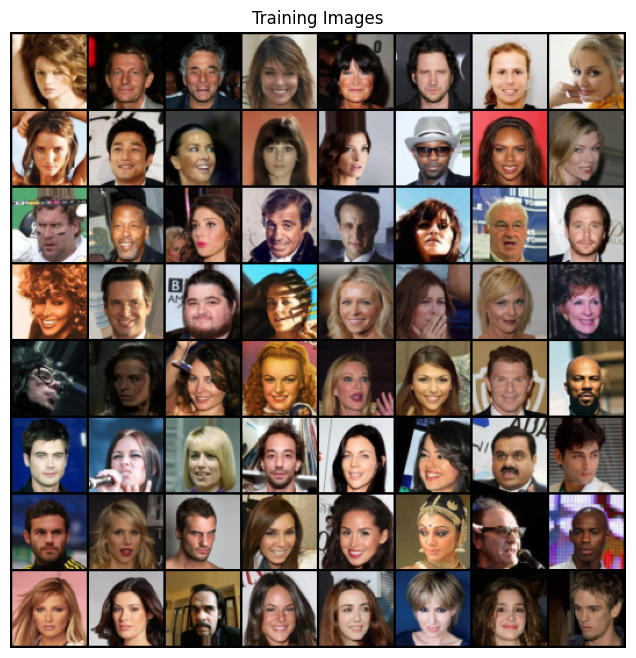

In [5]:
# # Для создания датасета используем класс ImageFolder
# # Создаем датасет
# dataset = dset.ImageFolder(root=dataroot,
#                            transform=transforms.Compose([
#                                transforms.Resize(image_size),
#                                transforms.CenterCrop(image_size),
#                                transforms.ToTensor(),
#                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
#                            ]))
# Создаем даталоадер
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Выбираем девайс для вычислений
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Нарисуем часть картинок из датасета
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [6]:
# кастомная инициализация весов netG или netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [31]:
import torch.nn as nn

class CSPup(nn.Module):
    def __init__(self, c, scale_factor=2):
        super().__init__()
        self.c = c 

        self.upsample_1 = nn.Upsample(scale_factor=scale_factor)
        self.conv_1 = nn.Conv2d(c //2, c//2, kernel_size=4, padding='same')
        self.relu_1 = nn.ReLU()
        
        self.upsample_2 = nn.Upsample(scale_factor=scale_factor)
        self.conv_2 = nn.Conv2d(c //2, c//2, kernel_size=4, padding='same')
        self.relu_2 = nn.ReLU()
        
        
    def forward(self, x):
        half_channels = x.shape[1] // 2
        x_1, x_2 = torch.split(x, [half_channels, half_channels], dim=1)

        x_1 = self.upsample_1(x_1)

        x_2 = self.conv_1(x_2)
        x_2 = self.relu_1(x_2)
        x_2 = self.upsample_2(x_2)

        x_2 = self.conv_2(x_2)
        x_2 = self.relu_2(x_2)
        
        return x_1 + x_2


# Имплементация генератора
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.initial_conv = nn.ConvTranspose2d(nz, ngf * 16, 1, 1, 0, bias=False)
        self.cspup1 = CSPup(c=ngf * 16)
        self.cspup2 = CSPup(c=ngf* 8)
        self.cspup3 = CSPup(c=ngf * 4)
        self.cspup4 = CSPup(c=ngf * 2)
        self.cspup5 = CSPup(c=ngf)
    

        self.deconv =  nn.ConvTranspose2d(ngf // 2, nc, 4, 2, 1, bias=False)
        self.relu = nn.ReLU()
        

    def forward(self, x):
        x = self.initial_conv(x)
        x = self.cspup1(x)
        x = self.cspup2(x)
        x = self.cspup3(x)
        x = self.cspup4(x)
        x = self.cspup5(x)

        x = self.deconv(x)
        x = self.relu(x)
        
        return x      
        

In [32]:
gen = Generator()

x = torch.randn(1, 100, 1, 1)

In [33]:
x.shape

torch.Size([1, 100, 1, 1])

In [34]:
x = gen(x)

In [35]:
x.shape

torch.Size([1, 3, 64, 64])

In [36]:
# Инициализируем генератор
netG = Generator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

Generator(
  (initial_conv): ConvTranspose2d(100, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (cspup1): CSPup(
    (upsample_1): Upsample(scale_factor=2.0, mode='nearest')
    (conv_1): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=same)
    (relu_1): ReLU()
    (upsample_2): Upsample(scale_factor=2.0, mode='nearest')
    (conv_2): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=same)
    (relu_2): ReLU()
  )
  (cspup2): CSPup(
    (upsample_1): Upsample(scale_factor=2.0, mode='nearest')
    (conv_1): Conv2d(256, 256, kernel_size=(4, 4), stride=(1, 1), padding=same)
    (relu_1): ReLU()
    (upsample_2): Upsample(scale_factor=2.0, mode='nearest')
    (conv_2): Conv2d(256, 256, kernel_size=(4, 4), stride=(1, 1), padding=same)
    (relu_2): ReLU()
  )
  (cspup3): CSPup(
    (upsample_1): Upsample(scale_factor=2.0, mode='nearest')
    (conv_1): Conv2d(128, 128, kernel_size=(4, 4), stride=(1, 1), padding=same)
    (relu_1): ReLU()
    (upsample_2): Upsa

In [37]:
# Имплементация дискриминатора

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [38]:
# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [39]:
# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

# Устанавливаем оптимизаторы для G и D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [40]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/636]	Loss_D: 2.0353	Loss_G: 1.5050	D(x): 0.4437	D(G(z)): 0.5646 / 0.3119
[0/5][50/636]	Loss_D: 0.0041	Loss_G: 8.4933	D(x): 0.9990	D(G(z)): 0.0030 / 0.0011
[0/5][100/636]	Loss_D: 0.0026	Loss_G: 6.7849	D(x): 0.9996	D(G(z)): 0.0022 / 0.0019
[0/5][150/636]	Loss_D: 0.0002	Loss_G: 34.2781	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[0/5][200/636]	Loss_D: 0.0000	Loss_G: 33.8214	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[0/5][250/636]	Loss_D: 0.0000	Loss_G: 33.6655	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[0/5][300/636]	Loss_D: 0.0001	Loss_G: 38.0775	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[0/5][350/636]	Loss_D: 0.0030	Loss_G: 9.0309	D(x): 0.9980	D(G(z)): 0.0004 / 0.0003
[0/5][400/636]	Loss_D: 0.0006	Loss_G: 9.7021	D(x): 0.9999	D(G(z)): 0.0006 / 0.0003
[0/5][450/636]	Loss_D: 0.0013	Loss_G: 7.4537	D(x): 0.9999	D(G(z)): 0.0012 / 0.0009
[0/5][500/636]	Loss_D: 0.0006	Loss_G: 8.4290	D(x): 1.0000	D(G(z)): 0.0005 / 0.0003
[0/5][550/636]	Loss_D: 0.0000	Loss_G: 45.0616	D(x): 1.0000	D

KeyboardInterrupt: 

# Imrovement

In [22]:
import torch.nn as nn

class CSPup(nn.Module):
    def __init__(self, c, scale_factor=2):
        super().__init__()
        self.c = c 

        self.upsample_1 = nn.Upsample(scale_factor=scale_factor)
        self.conv_1 = nn.Conv2d(c //2, c//2, kernel_size=4, padding='same', bias=False)
        self.relu_1 = nn.ReLU()
        self.batch_norm_1 = nn.BatchNorm2d(c // 2)
        
        self.upsample_2 = nn.Upsample(scale_factor=scale_factor)
        self.conv_2 = nn.Conv2d(c //2, c//2, kernel_size=4, padding='same', bias=False)
        self.batch_norm_2 = nn.BatchNorm2d(c // 2)
        self.relu_2 = nn.ReLU()
        
        
    def forward(self, x):
        half_channels = x.shape[1] // 2
        x_1, x_2 = torch.split(x, [half_channels, half_channels], dim=1)

        x_1 = self.upsample_1(x_1)

        x_2 = self.conv_1(x_2)
        x_2 = self.batch_norm_1(x_2)
        x_2 = self.relu_1(x_2)
        x_2 = self.upsample_2(x_2)

        x_2 = self.conv_2(x_2)
        x_2 = self.batch_norm_2(x_2)
        x_2 = self.relu_2(x_2)
        
        return x_1 + x_2


# Имплементация генератора
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.initial_conv = nn.ConvTranspose2d(nz, ngf * 16, 1, 1, 0, bias=False)
        self.cspup1 = CSPup(c=ngf * 16)
        self.cspup2 = CSPup(c=ngf* 8)
        self.cspup3 = CSPup(c=ngf * 4)
        self.cspup4 = CSPup(c=ngf * 2)
        self.cspup5 = CSPup(c=ngf)
    

        self.deconv =  nn.ConvTranspose2d(ngf // 2, nc, 4, 2, 1, bias=False)
        self.activation = nn.Tanh()
        

    def forward(self, x):
        x = self.initial_conv(x)
        x = self.cspup1(x)
        x = self.cspup2(x)
        x = self.cspup3(x)
        x = self.cspup4(x)
        x = self.cspup5(x)

        x = self.deconv(x)
        x = self.activation(x)
        
        return x      
        

In [23]:
gen = Generator()

x = torch.randn(2, 100, 1, 1)

In [24]:
x = gen(x)
x.shape

torch.Size([2, 3, 64, 64])

In [25]:
# Инициализируем генератор
netG = Generator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

Generator(
  (initial_conv): ConvTranspose2d(100, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (cspup1): CSPup(
    (upsample_1): Upsample(scale_factor=2.0, mode='nearest')
    (conv_1): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=same, bias=False)
    (relu_1): ReLU()
    (batch_norm_1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (upsample_2): Upsample(scale_factor=2.0, mode='nearest')
    (conv_2): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), padding=same, bias=False)
    (batch_norm_2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu_2): ReLU()
  )
  (cspup2): CSPup(
    (upsample_1): Upsample(scale_factor=2.0, mode='nearest')
    (conv_1): Conv2d(256, 256, kernel_size=(4, 4), stride=(1, 1), padding=same, bias=False)
    (relu_1): ReLU()
    (batch_norm_1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (upsample_2): Upsample(sca

In [26]:
# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)

# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

# Устанавливаем оптимизаторы для G и D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [27]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/636]	Loss_D: 2.1319	Loss_G: 7.1974	D(x): 0.6674	D(G(z)): 0.7619 / 0.0027
[0/5][50/636]	Loss_D: 0.3673	Loss_G: 7.9015	D(x): 0.9587	D(G(z)): 0.2211 / 0.0023
[0/5][100/636]	Loss_D: 0.3532	Loss_G: 5.5295	D(x): 0.8590	D(G(z)): 0.1230 / 0.0064
[0/5][150/636]	Loss_D: 0.6345	Loss_G: 8.6880	D(x): 0.9216	D(G(z)): 0.3917 / 0.0010
[0/5][200/636]	Loss_D: 0.5113	Loss_G: 7.7119	D(x): 0.8793	D(G(z)): 0.2729 / 0.0006
[0/5][250/636]	Loss_D: 0.7255	Loss_G: 10.9996	D(x): 0.9375	D(G(z)): 0.4420 / 0.0001
[0/5][300/636]	Loss_D: 1.0314	Loss_G: 4.2507	D(x): 0.5558	D(G(z)): 0.1043 / 0.0204
[0/5][350/636]	Loss_D: 1.1661	Loss_G: 9.5710	D(x): 0.9431	D(G(z)): 0.6398 / 0.0001
[0/5][400/636]	Loss_D: 0.2480	Loss_G: 5.6221	D(x): 0.8935	D(G(z)): 0.0830 / 0.0046
[0/5][450/636]	Loss_D: 0.9974	Loss_G: 6.0708	D(x): 0.8500	D(G(z)): 0.5142 / 0.0027
[0/5][500/636]	Loss_D: 1.0770	Loss_G: 3.8047	D(x): 0.5649	D(G(z)): 0.2271 / 0.0252
[0/5][550/636]	Loss_D: 0.8102	Loss_G: 4.0065	D(x): 0.6449	D(G(z

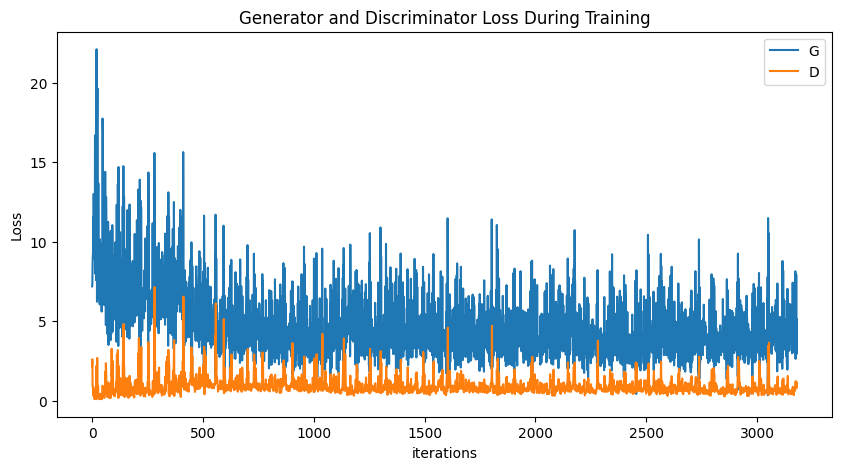

In [28]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

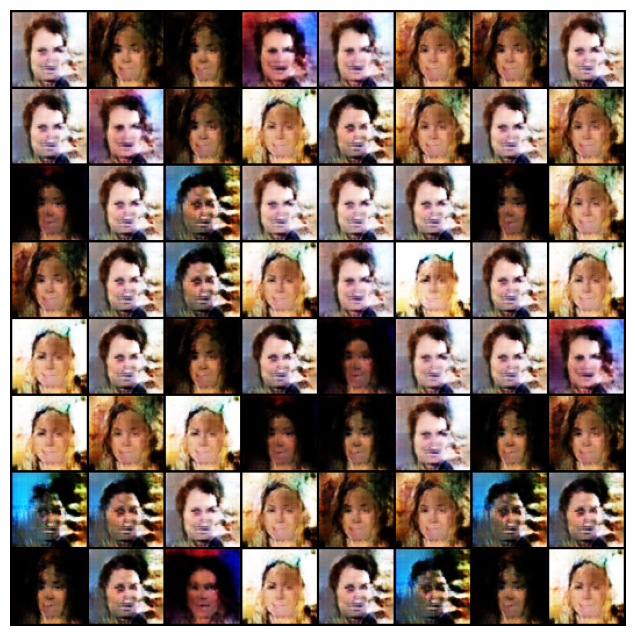

In [29]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

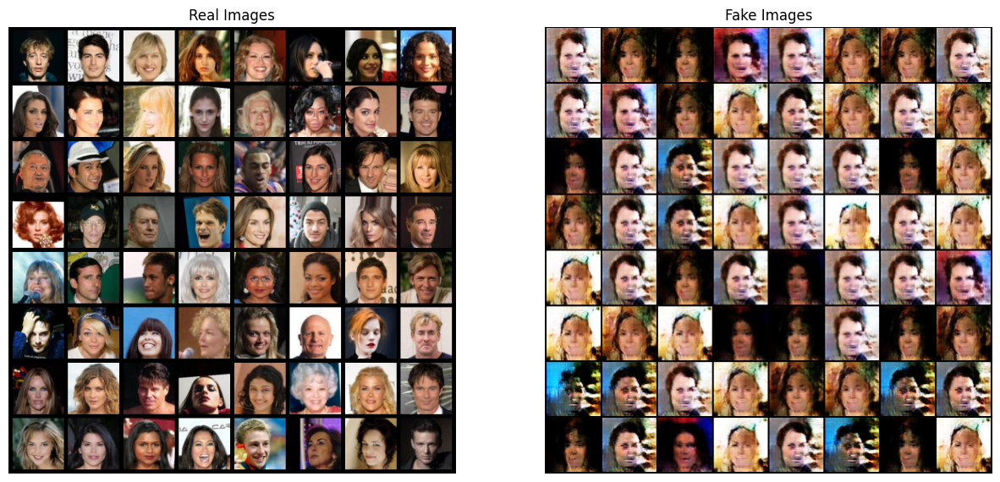

In [30]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()